Shashwat Roy (B21CS071),
Yogesh Jangir (B21CS083),
Pranav Pant (B21CS088)

In [ ]:
import numpy as np
import matplotlib.cm as cm
import plotly.express as px
from sklearn.model_selection import KFold
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, silhouette_score
import seaborn as sns
from scipy.linalg import eig
import matplotlib.pyplot as plt
import math
from sklearn import svm
from mlxtend.plotting import plot_sequential_feature_selection
from random import random
from random import randrange
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import accuracy_score , confusion_matrix
from sklearn import metrics
import random
import statsmodels.api as sm
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler , LabelEncoder
!pip install scikit-fda
import skfda
from skfda.ml.clustering import FuzzyCMeans
from skfda import FDataGrid
from sklearn.cluster import KMeans
import sklearn
import warnings
warnings.filterwarnings('ignore')

# Data Visualization

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
Country_data=pd.read_csv("/content/Country-data.csv")
Country_data

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


In [ ]:
Country_data.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000


In [ ]:
Country_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


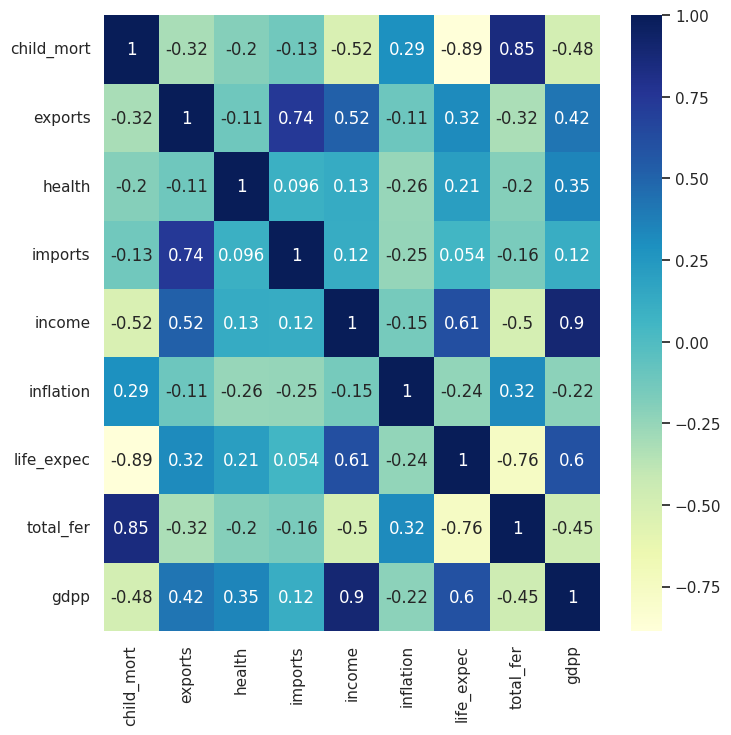

In [ ]:
from matplotlib import rcParams
sns.heatmap(Country_data.corr(), cmap="YlGnBu", annot=True)
rcParams['figure.figsize'] = 8,15

From the correlation figure, there are some things that we can infer:-
1. Child_mortality has a negative correlation with income, gdpp and a +ve correlation with total_fertility. We can say that when Income, gdpp increase, child mortality decreases. On the other hand, when total_fertility increases, child mortality increases(which is obvious).
2. Rise in income leads to rise in life-expectancy.
3. Rise in exports increases gdpp, income & imports.

## Visualize Data Distribution

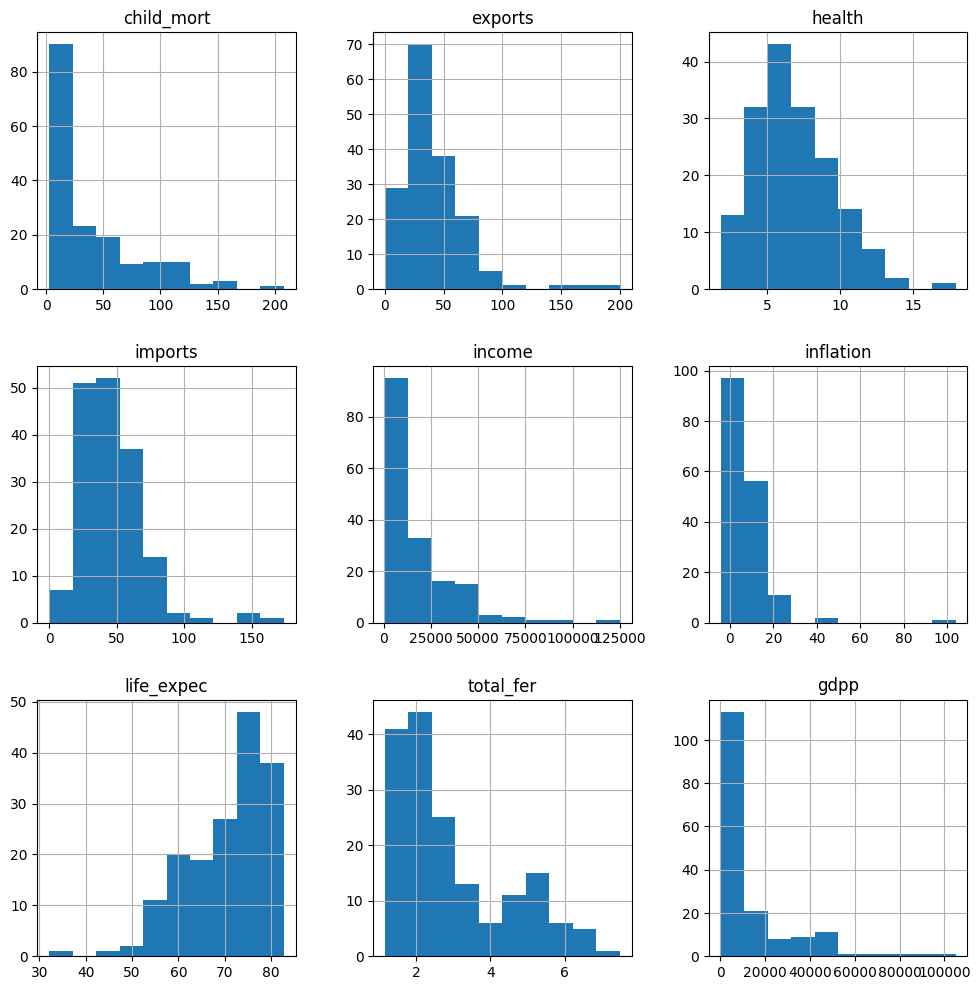

In [ ]:
Country_data.hist(figsize =(12,12))
plt.show()

In [ ]:
!pip install -U kaleido

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 11.8 MB/s eta 0:00:00


In [ ]:
import kaleido
import plotly.express as px
print("Country Data plotted on World map:- ")
for i in Country_data.drop('country', axis=1).columns:
    fig = px.choropleth(Country_data,
                        locationmode='country names',
                        locations='country',
                         title=i+' per country (World)',color=i,color_continuous_scale="sunset"
                       )
    fig.update_geos(fitbounds="locations", visible=True)
    fig.show(engine='kaleido')

Country Data plotted on World map:- 


Some inferences form these plots:-

1. Features like child mortality, inflation are high in poor countries, while income, exports and imports are low.  These seem to be the characteristics of poor countries.
2. On the other hand, the countries with high GDP and Income spend good amount on health, have good exports and imports, and have a high life expectancy.


# **Data Visualization**

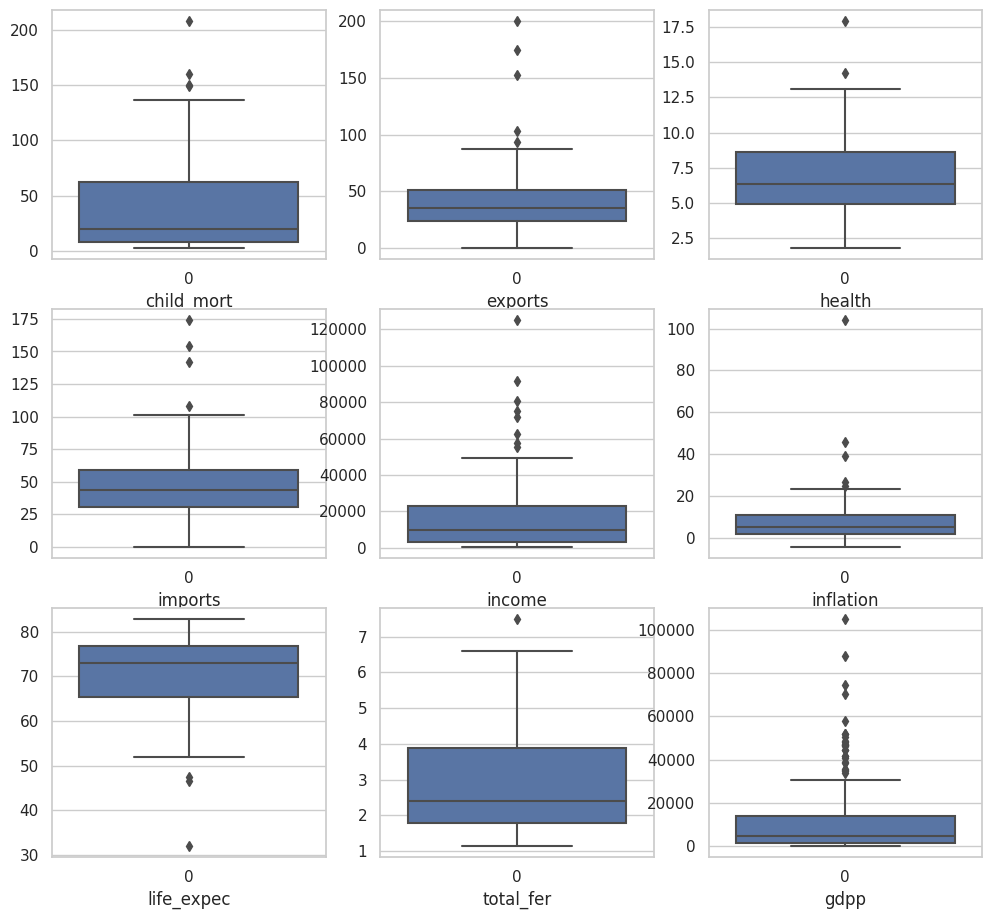

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(12, 11))
cols = np.array(Country_data.columns[1:]).reshape(3, 3)

for i in range(3):
    for j in range(3):
        sns.boxplot(Country_data.loc[:, cols[i][j]], ax=ax[i][j])
        ax[i][j].set_xlabel(cols[i][j])

plt.show()

From the boxplot of each column, here are some things that we can infer:-


1.   The average child mortality rate is less, maximum between 0-50. There are only very few countries where this is high.
2.   In most of the countries, the inflation is less, (< 8%) with only a few exceptions.
3. The average life expectancy is high (65-75).
4. The total fertility ranges broadly between 2-4.



# **Preprocessing**

### Checking for null values

In [ ]:
print("Number of null values in each column are:- \n")
Country_data.isnull().sum()

Number of null values in each column are:- 



country       0
child_mort    0
exports       0
health        0
imports       0
income        0
inflation     0
life_expec    0
total_fer     0
gdpp          0
dtype: int64

We can see that there are no null values in the dataset.

In [ ]:
Country_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


Since all the countries are unique in the country column and there is no use of them if converted via scaling, hence we drop this column.

In [ ]:
Country_data=Country_data.drop('country',axis=1)

In [ ]:
Country_data

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...
162,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


### Scaling the data through Standard Scaler.

In [ ]:
Scaled_data= StandardScaler().fit_transform(Country_data)

# PCA

In [ ]:
import plotly.io as plt_io
import plotly.graph_objects as go
Scaled = StandardScaler()
y = Country_data['gdpp']
pca_model = PCA(n_components = 9)
# data_pca = pca_model.fit_transform(Scaled_data)
pca_model.fit(Scaled_data)
eigenvalue = pca_model.explained_variance_ratio_
cum_sum_eigenvalues = np.cumsum(eigenvalue)

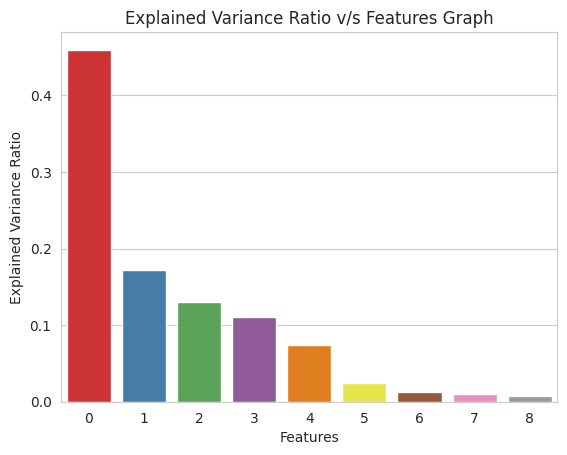

In [ ]:
comps=np.arange(0,len(eigenvalue),1)

sns.barplot(x=comps, y=eigenvalue, palette='Set1')
sns.set_style('whitegrid')
plt.title('Explained Variance Ratio v/s Features Graph')
plt.xlabel('Features')
plt.ylabel('Explained Variance Ratio')
plt.show()

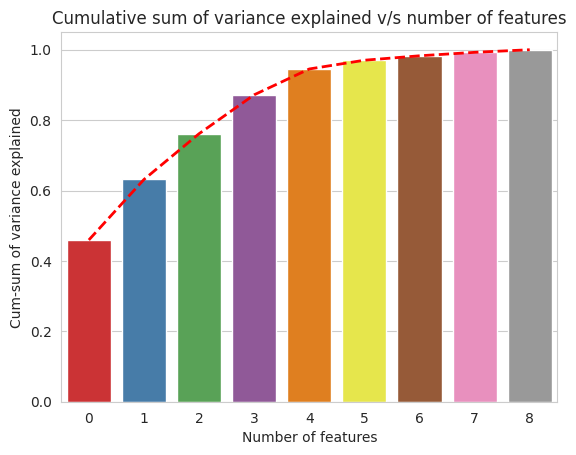

In [ ]:
plt.plot(comps, cum_sum_eigenvalues, 'r--', linewidth=2)
sns.barplot(x=comps, y=cum_sum_eigenvalues, palette='Set1')
plt.title('Cumulative sum of variance explained v/s number of features')
plt.xlabel('Number of features')
plt.ylabel('Cum-sum of variance explained')
plt.show()

Using the cumulative variance curve, we can see that for conserving >90% of the variance, we would have to choose number of components=6. Hence, we set n_components=6 for PCA.

In [ ]:
pca_model = PCA(n_components = 6)
data_pca = pca_model.fit_transform(Scaled_data)

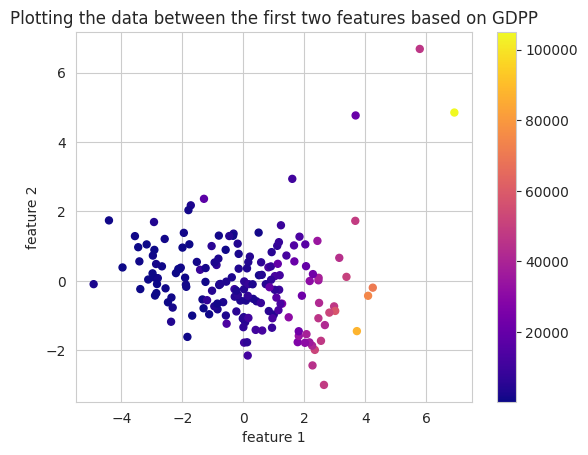

In [ ]:
plt.scatter(data_pca[:, 0], data_pca[:, 1], c=y, s=25, cmap='plasma')
plt.xlabel('feature 1')
plt.ylabel('feature 2')
plt.title('Plotting the data between the first two features based on GDPP')
plt.colorbar()
plt.show()

# t-SNE

**t-SNE** (t-distributed stochastic neighbor embedding) is a machine learning algorithm used for data visualization by projecting high-dimensional data into a low-dimensional space while preserving the structure and similarity between data points.

t-SNE can only reduce dimension till below 4 components

In [ ]:
from sklearn.manifold import TSNE
from scipy.spatial.distance import pdist, squareform
tsne_model = TSNE(n_components=3)
data_tsne = tsne_model.fit_transform(Scaled_data)
varience_explained = np.sum(tsne_model.kl_divergence_) / np.prod(data_tsne.shape)
print(varience_explained)
distances = squareform(pdist(data_tsne))
embedding_var = np.var(distances)

0.0007482500609285579


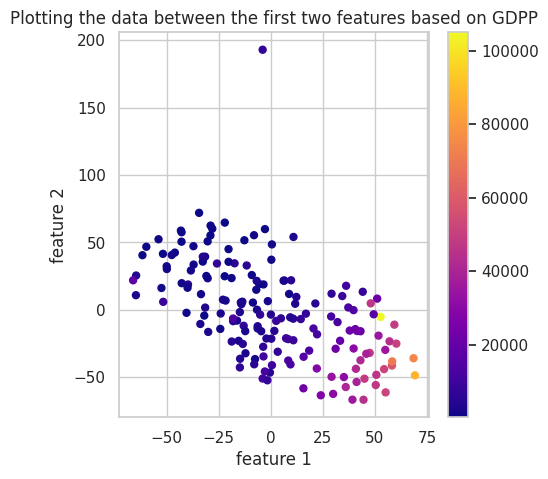

In [ ]:
plt.scatter(data_tsne[:,0],data_tsne[:,1], c=y, s=25, cmap='plasma')
plt.title('Plotting the data between the first two features based on GDPP')
plt.xlabel('feature 1')
plt.colorbar()
plt.ylabel('feature 2')
plt.show()

# Heirarchial Clustering

### Heirarchial Clustering (PCA)

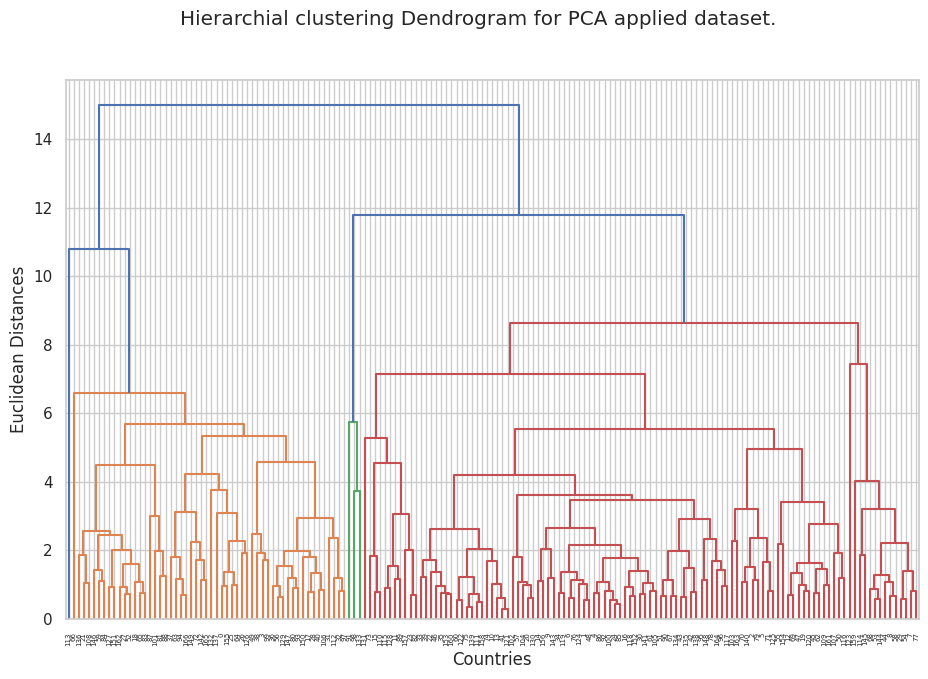

In [ ]:
import scipy.cluster.hierarchy as sch
fig=plt.figure(figsize=(11,7))
dendrogram = sch.dendrogram(sch.linkage(data_pca, method = 'complete'))
plt.suptitle('Hierarchial clustering Dendrogram for PCA applied dataset.')
plt.xlabel('Countries')
plt.ylabel('Euclidean Distances')
plt.show()

For getting the best number of clusters, we identify the longest vertical line that does not intersect any horizontal line. This line represents the greatest distance between any two points that are merged into a single cluster and the  distance is called the "optimal distance."

We can see that the longest line is blue color, and on cuttting that, we get optimal number of clusters =4.

### Silhouette Score

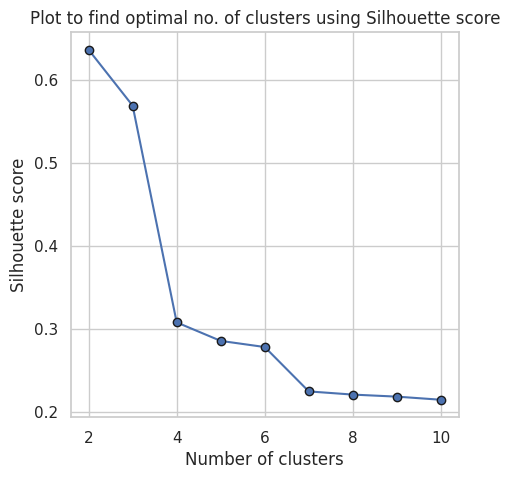

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

silhouette_scores = []
for i in range(2, 11):
    clustering = AgglomerativeClustering(n_clusters=i, linkage='complete')
    labels = clustering.fit_predict(data_pca)
    silhouette_avg = silhouette_score(data_pca, labels)
    silhouette_scores.append(silhouette_avg)

plt.plot(range(2, 11), silhouette_scores, marker='o',markeredgecolor='k')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Plot to find optimal no. of clusters using Silhouette score')
plt.show()

### Davies Bouldin score

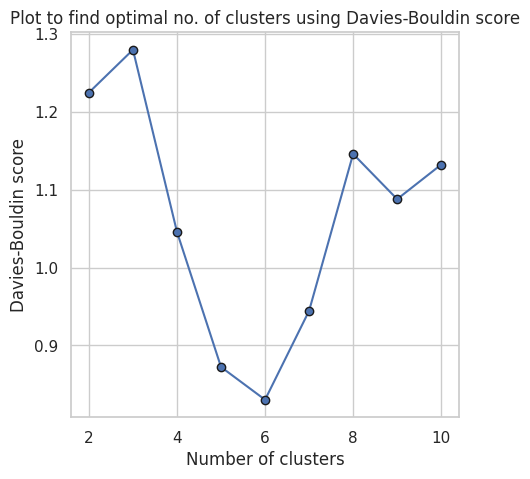

In [ ]:
from sklearn.metrics import davies_bouldin_score

davies_bouldin_scores = []
for i in range(2, 11):
    clustering = AgglomerativeClustering(n_clusters=i, linkage='ward')
    labels = clustering.fit_predict(data_pca)
    db_score = davies_bouldin_score(data_pca, labels)
    davies_bouldin_scores.append(db_score)

plt.plot(range(2, 11), davies_bouldin_scores, marker='o',markeredgecolor='k')
plt.xlabel('Number of clusters')
plt.ylabel('Davies-Bouldin score')
plt.title('Plot to find optimal no. of clusters using Davies-Bouldin score')
plt.show()


Considering all the plots, i.e, dendogram, silhouette score and davies bouldin score, we can see that the optimal number of clusters is 4.

## Plots for heirarchial clustering - PCA

In [ ]:
from sklearn.cluster import AgglomerativeClustering
agglo_model=AgglomerativeClustering(4)
Country_data1 = pd.read_csv("/content/drive/MyDrive/Country-data.csv")
Country_data1['label'] = agglo_model.fit_predict(data_pca)
Country_data1.head(20)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.440,56.2,5.82,553,0
1,Albania,16.6,28.0,6.55,48.6,9930,4.490,76.3,1.65,4090,2
2,Algeria,27.3,38.4,4.17,31.4,12900,16.100,76.5,2.89,4460,2
3,Angola,119.0,62.3,2.85,42.9,5900,22.400,60.1,6.16,3530,0
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.440,76.8,2.13,12200,2
5,Argentina,14.5,18.9,8.10,16.0,18700,20.900,75.8,2.37,10300,2
6,Armenia,18.1,20.8,4.40,45.3,6700,7.770,73.3,1.69,3220,2
7,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900,1
8,Austria,4.3,51.3,11.00,47.8,43200,0.873,80.5,1.44,46900,1
9,Azerbaijan,39.2,54.3,5.88,20.7,16000,13.800,69.1,1.92,5840,2


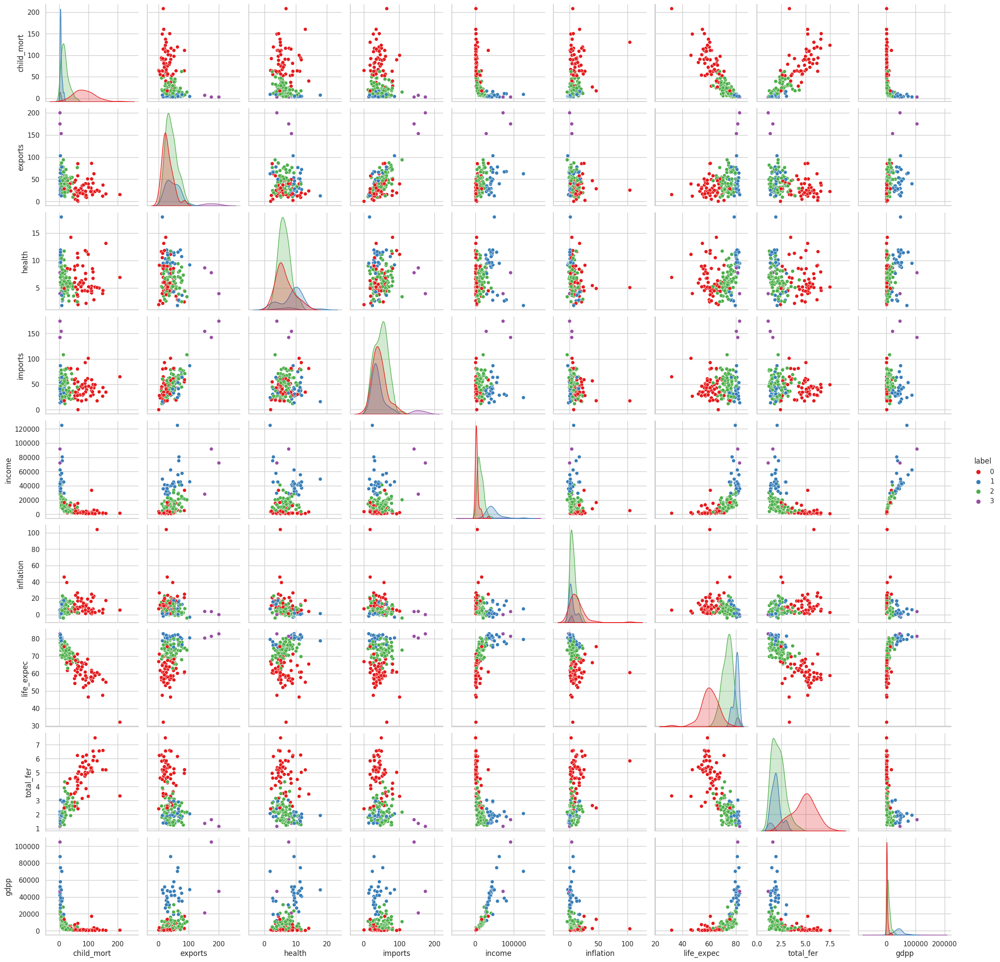

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(Country_data1, hue='label',palette='Set1');

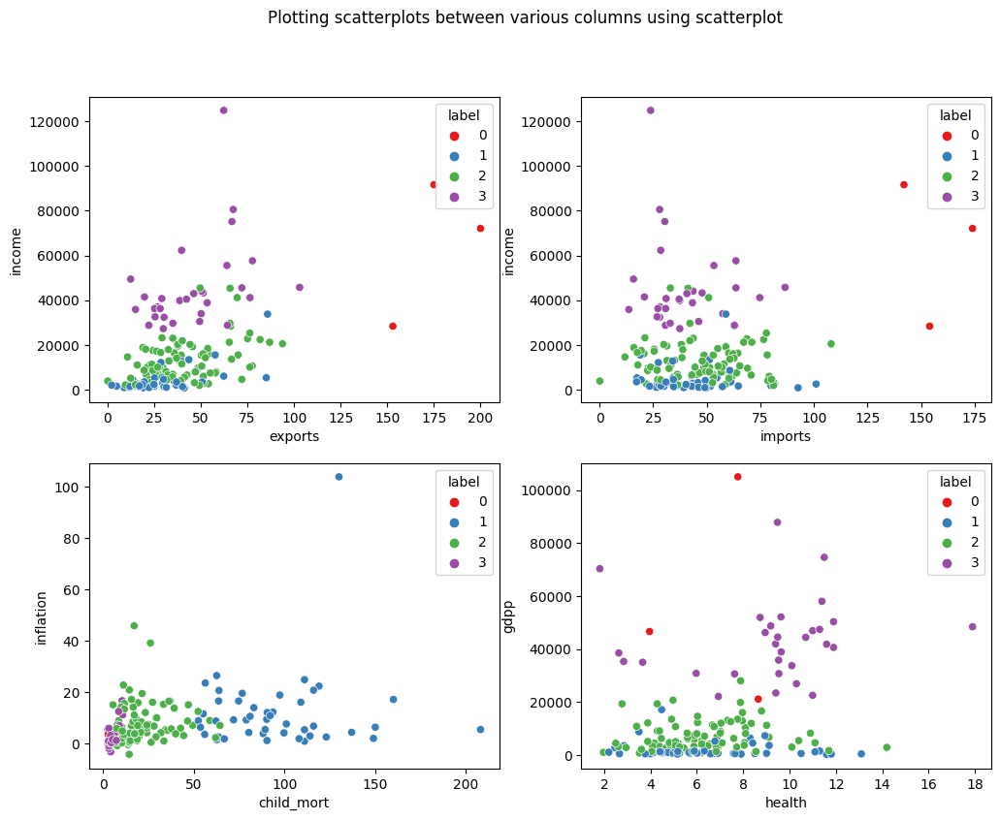

In [ ]:
fig,axs=plt.subplots(nrows=2,ncols=2,figsize=(12,9))
sns.scatterplot(data=Country_data1, x='exports', y='income', hue='label',palette='Set1', ax=axs[0][0])
sns.scatterplot(data=Country_data1, x='imports', y='income', hue='label',palette='Set1', ax=axs[0][1])
sns.scatterplot(data=Country_data1, x='child_mort', y='inflation', hue='label',palette='Set1', ax=axs[1][0])
sns.scatterplot(data=Country_data1, x='health', y='gdpp', hue='label', palette='Set1',ax=axs[1][1])
fig.suptitle("Plotting scatterplots between various columns using scatterplot")
plt.show()

In [ ]:
Country_data1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,0
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,0
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,0
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,2
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,0


In [ ]:
category1 = "Cluster 1"
category2 = "Cluster 2"
category3 = "Cluster 3"
category4 = "Cluster 4"
category = {0:category1,1:category2,2:category3,3:category4}
Country_data1['label'] = Country_data1['label'].map(category)
Country_data1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,Cluster 1
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,Cluster 3
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,Cluster 3
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,Cluster 1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,Cluster 3
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,Cluster 3
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,Cluster 1
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,Cluster 3
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,Cluster 1


In [ ]:
px.choropleth(data_frame=Country_data1, locationmode='country names', locations='country', color=Country_data1['label'], title='Countries clusters with Cluster 1 having the highest need for aid and Cluster 4 the lowest',
              color_discrete_map={'Cluster 2':'#FFEC06','Cluster 1':'#06FF0A','Cluster 3':'#C73313','Cluster 4':'#3454EE'} ,projection='equirectangular')

We can see that heirarchial clustering does a good job in getting the countries in different clusters according to their features. However, there are few countries not correctly assigned, as the plots show that there are not many countires falling in the last bracket.
But overall, the performance of heirarcial clustering in this dataset is good.  

## Heirarchial Clustering (t-SNE)

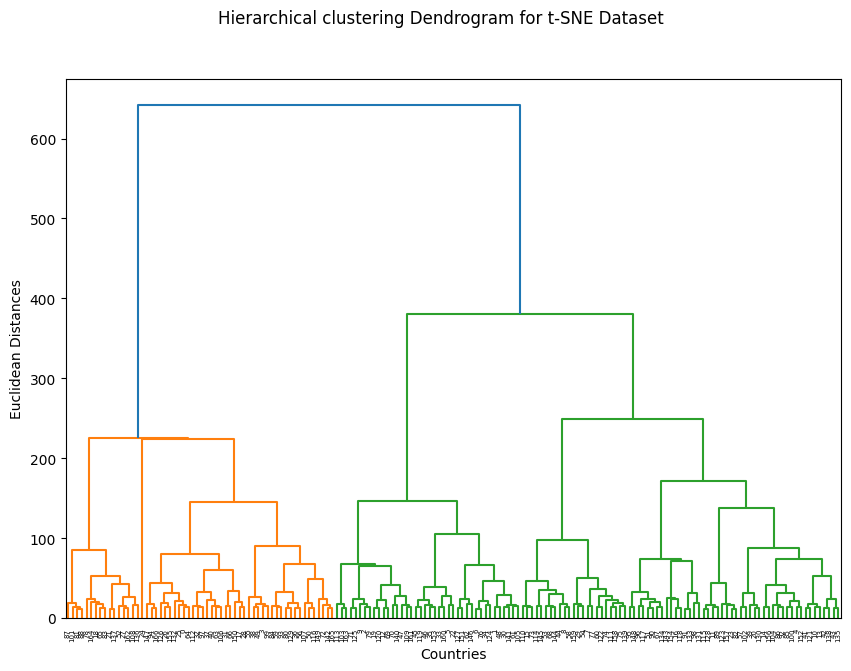

In [ ]:
import scipy.cluster.hierarchy as sch
fig=plt.figure(figsize=(10,7))
dendrogram = sch.dendrogram(sch.linkage(data_tsne, method='ward'))
plt.suptitle('Hierarchical clustering Dendrogram for t-SNE Dataset')
plt.xlabel('Countries')
plt.ylabel('Euclidean Distances')
plt.show()


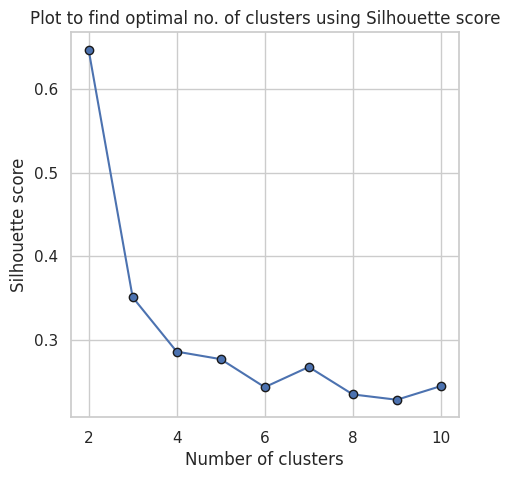

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

silhouette_scores = []
for i in range(2, 11):
    clustering = AgglomerativeClustering(n_clusters=i, linkage='complete')
    labels = clustering.fit_predict(data_tsne)
    silhouette_avg = silhouette_score(data_tsne, labels)
    silhouette_scores.append(silhouette_avg)

plt.plot(range(2, 11), silhouette_scores, marker='o',markeredgecolor='k')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Plot to find optimal no. of clusters using Silhouette score')
plt.show()



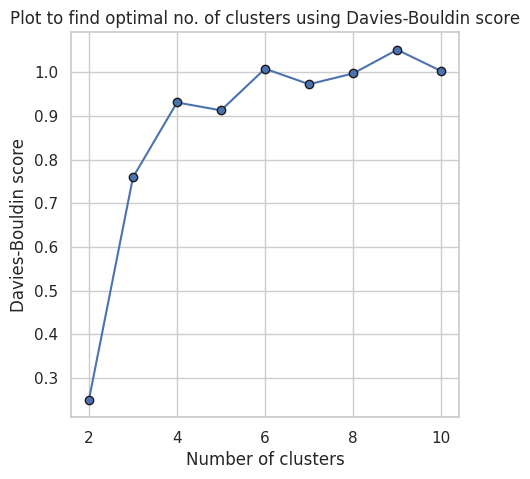

In [ ]:
from sklearn.metrics import davies_bouldin_score

davies_bouldin_scores = []
for i in range(2, 11):
    clustering = AgglomerativeClustering(n_clusters=i, linkage='complete')
    labels = clustering.fit_predict(data_tsne)
    db_score = davies_bouldin_score(data_tsne, labels)
    davies_bouldin_scores.append(db_score)

plt.plot(range(2, 11), davies_bouldin_scores, marker='o',markeredgecolor='k')
plt.xlabel('Number of clusters')
plt.ylabel('Davies-Bouldin score')
plt.title('Plot to find optimal no. of clusters using Davies-Bouldin score')
plt.show()


Using t-SNE transformation, we get optimal clusters=2.

## Plots for t-SNE

In [ ]:
from sklearn.cluster import AgglomerativeClustering
agglo_model=AgglomerativeClustering(2)
Country_data1 = pd.read_csv("/content/drive/MyDrive/Country-data.csv")
Country_data1['label'] = agglo_model.fit_predict(data_tsne)
Country_data1.head(20)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.440,56.2,5.82,553,1
1,Albania,16.6,28.0,6.55,48.6,9930,4.490,76.3,1.65,4090,0
2,Algeria,27.3,38.4,4.17,31.4,12900,16.100,76.5,2.89,4460,0
3,Angola,119.0,62.3,2.85,42.9,5900,22.400,60.1,6.16,3530,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.440,76.8,2.13,12200,0
5,Argentina,14.5,18.9,8.10,16.0,18700,20.900,75.8,2.37,10300,0
6,Armenia,18.1,20.8,4.40,45.3,6700,7.770,73.3,1.69,3220,0
7,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900,0
8,Austria,4.3,51.3,11.00,47.8,43200,0.873,80.5,1.44,46900,0
9,Azerbaijan,39.2,54.3,5.88,20.7,16000,13.800,69.1,1.92,5840,0


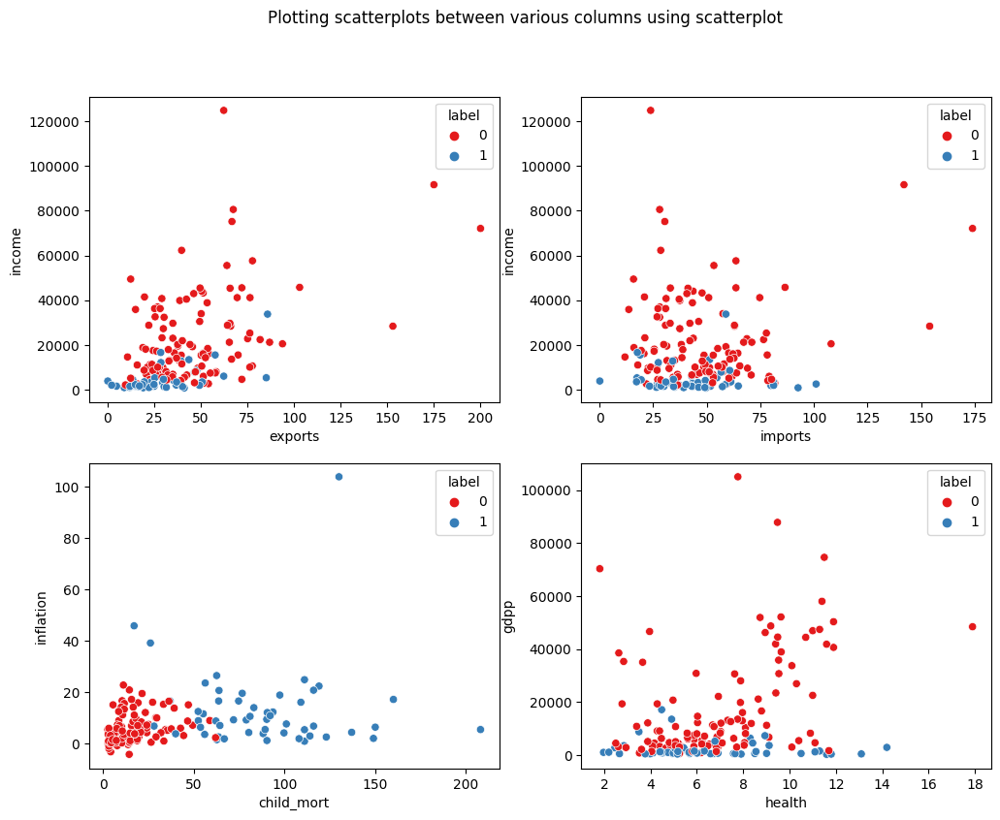

In [ ]:
fig,axs=plt.subplots(nrows=2,ncols=2,figsize=(12,9))
sns.scatterplot(data=Country_data1, x='exports', y='income', hue='label',palette='Set1', ax=axs[0][0])
sns.scatterplot(data=Country_data1, x='imports', y='income', hue='label',palette='Set1', ax=axs[0][1])
sns.scatterplot(data=Country_data1, x='child_mort', y='inflation', hue='label',palette='Set1', ax=axs[1][0])
sns.scatterplot(data=Country_data1, x='health', y='gdpp', hue='label', palette='Set1',ax=axs[1][1])
fig.suptitle("Plotting scatterplots between various columns using scatterplot")
plt.show()

In [ ]:
Country_data1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,0
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,0
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,0
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,0
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,1
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1


In [ ]:
category1 = "Cluster 1"
category2 = "Cluster 2"
category3 = "Cluster 3"
category4 = "Cluster 4"
category = {0:category1,1:category2,2:category3,3:category4}
Country_data1['label'] = Country_data1['label'].map(category)
Country_data1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,Cluster 2
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,Cluster 1
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,Cluster 1
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,Cluster 2
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,Cluster 1
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,Cluster 1
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,Cluster 2
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,Cluster 1
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,Cluster 2


In [ ]:
px.choropleth(data_frame=Country_data1, locationmode='country names', locations='country', color=Country_data1['label'], title='Countries clusters with Cluster 1 having the highest need for aid and Cluster 2 the lowest',
              color_discrete_map={'Cluster 2':'#FFEC06','Cluster 1':'#06FF0A','Cluster 3':'#C73313','Cluster 4':'#3454EE'} ,projection='equirectangular')

Since, there are only 2 optimal clusters for t-SNE, we can say that this is not optimal, as with 2 clusters, we would not be able to fully differenciate between the countries. This would only be a broad classification. Hence, we would not use t-SNE transformation for the plots.
    

#K-means clustering

## **K-mean clustering(PCA)**

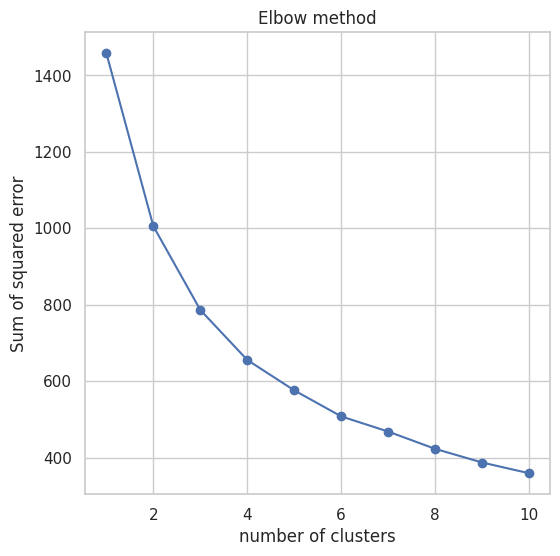

In [ ]:
from sklearn.cluster import KMeans
pca_model = PCA(n_components = 6)
data_pca = pca_model.fit_transform(Scaled_data)
k = [1,2,3,4,5,6,7,8,9,10]
temp = []
for i in range(1,11):
  kmean_1 = KMeans(n_clusters = i,random_state = 42)
  kmean_1.fit(data_pca)
  temp.append(kmean_1.inertia_)
plt.figure(figsize = (6,6))
plt.plot(k,temp,marker = 'o')
plt.title('Elbow method')
plt.xlabel('number of clusters')
plt.ylabel('Sum of squared error')
plt.show()

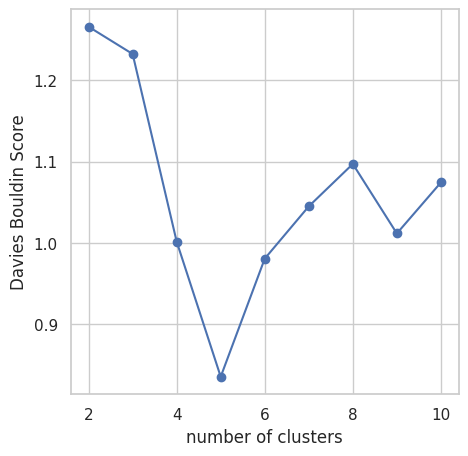

In [ ]:
pca_model = PCA(n_components = 6)
data_pca = pca_model.fit_transform(Scaled_data)
k2=[2,3,4,5,6,7,8,9,10]
temp1 = []
for i in range(2,11):
  kmean_1 = KMeans(n_clusters = i,random_state = 42)
  labels=kmean_1.fit_predict(data_pca)
  temp1.append(sklearn.metrics.davies_bouldin_score(data_pca, labels))
plt.plot(k2,temp1,marker = 'o')
plt.ylabel('Davies Bouldin Score')
plt.xlabel('number of clusters')
plt.rcParams["figure.figsize"] = (5,5)
plt.show()

In [ ]:
Silhouette_score = []
for i in range(2,11):
  kmea_1 = KMeans(n_clusters = i, random_state = 42)
  kmea_1.fit(data_pca)
  Silhouette_score.append(silhouette_score(data_pca,labels=kmea_1.labels_))
k1 = [2,3,4,5,6,7,8,9,10]
print(Silhouette_score)

[0.29637364602520705, 0.29680500099923157, 0.3153625222006951, 0.31409409480086964, 0.24913584248042633, 0.24414644179747974, 0.23782124060789167, 0.23386339243780488, 0.2330184040565199]


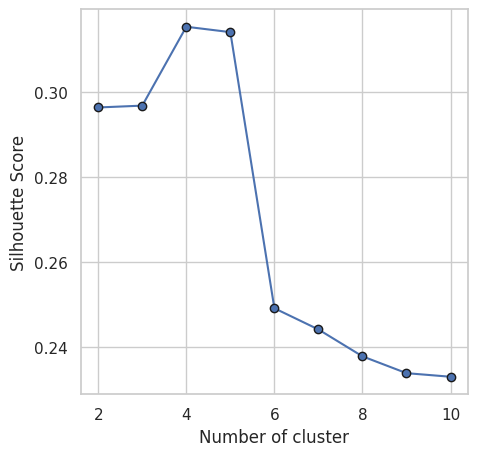

In [ ]:
plt.plot(k1,Silhouette_score,marker = 'o',markeredgecolor='k')
plt.xlabel('Number of cluster')
plt.ylabel('Silhouette Score')
plt.rcParams["figure.figsize"] = (5,5)
plt.show()

In [ ]:
# Judging by the elbow method,Silhouette score and Davies-Bouldin score , n_clusters=4
kmean_0 = KMeans(n_clusters = 4, random_state = 42)
kmean_0.fit(data_pca)

KMeans(n_clusters=4, random_state=42)

In [ ]:
Country_data1 = pd.read_csv("/content/drive/MyDrive/Country-data.csv")
Country_data1['label'] = kmean_0.fit_predict(data_pca)
Country_data1.head(20)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.440,56.2,5.82,553,1
1,Albania,16.6,28.0,6.55,48.6,9930,4.490,76.3,1.65,4090,2
2,Algeria,27.3,38.4,4.17,31.4,12900,16.100,76.5,2.89,4460,2
3,Angola,119.0,62.3,2.85,42.9,5900,22.400,60.1,6.16,3530,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.440,76.8,2.13,12200,2
5,Argentina,14.5,18.9,8.10,16.0,18700,20.900,75.8,2.37,10300,2
6,Armenia,18.1,20.8,4.40,45.3,6700,7.770,73.3,1.69,3220,2
7,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900,3
8,Austria,4.3,51.3,11.00,47.8,43200,0.873,80.5,1.44,46900,3
9,Azerbaijan,39.2,54.3,5.88,20.7,16000,13.800,69.1,1.92,5840,2


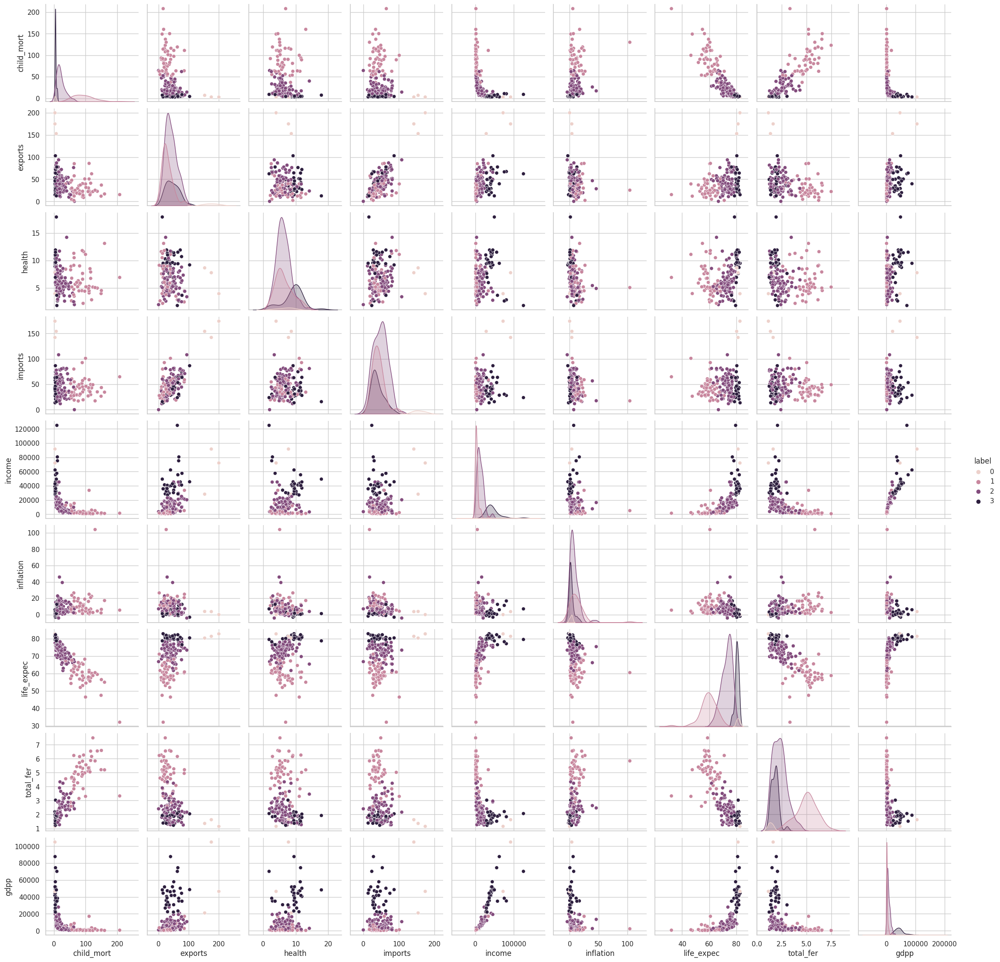

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(Country_data1, hue='label');

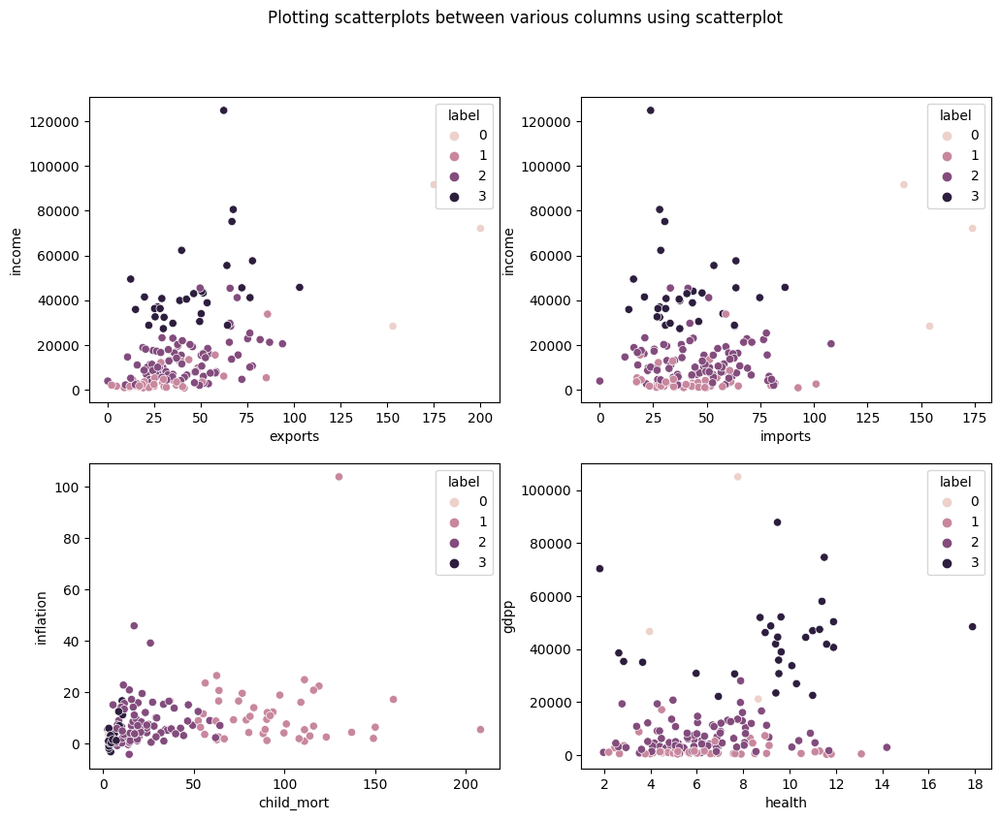

In [ ]:
fig,axs=plt.subplots(nrows=2,ncols=2,figsize=(12,9))
sns.scatterplot(data=Country_data1, x='exports', y='income', hue='label',cmap='viridis', ax=axs[0][0])
sns.scatterplot(data=Country_data1, x='imports', y='income', hue='label',cmap='viridis', ax=axs[0][1])
sns.scatterplot(data=Country_data1, x='child_mort', y='inflation', hue='label',cmap='viridis', ax=axs[1][0])
sns.scatterplot(data=Country_data1, x='health', y='gdpp', hue='label', cmap='viridis',ax=axs[1][1])
fig.suptitle("Plotting scatterplots between various columns using scatterplot")
plt.show()

In [ ]:
category1 = "Cluster 1"
category2 = "Cluster 2"
category3 = "Cluster 3"
category4 = "Cluster 4"
category = {0:category1,1:category2,2:category3,3:category4}
Country_data1['label'] = Country_data1['label'].map(category)
Country_data1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,Cluster 2
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,Cluster 3
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,Cluster 3
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,Cluster 2
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,Cluster 3
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,Cluster 3
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,Cluster 3
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,Cluster 3
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,Cluster 2


In [ ]:
px.choropleth(data_frame=Country_data1, locationmode='country names', locations='country', color=Country_data1['label'], title='Countries clusters with need for aid rising in the order: Cluster 1,Cluster 4,Cluster 3,Cluster 2',
              color_discrete_map={'Cluster 1':'#FFEC06','Cluster 2':'#06FF0A','Cluster 3':'#C73313','Cluster 4':'#3454EE'} ,projection='equirectangular')

## **Kmean clustering(t-SNE)**

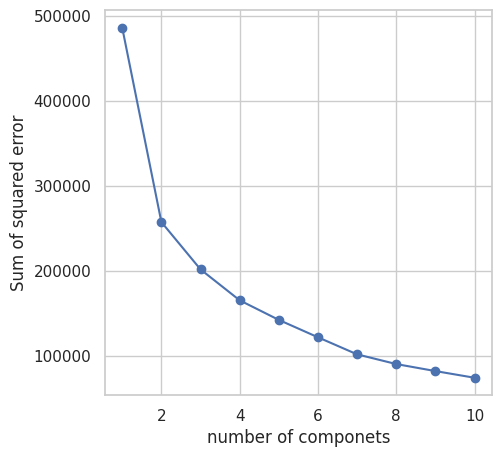

In [ ]:
tsne_model = TSNE(n_components=3)
data_tsne = tsne_model.fit_transform(Scaled_data)
Sse = []
k = [1,2,3,4,5,6,7,8,9,10]
for i in range(1,11):
  kmean_2 = KMeans(n_clusters = i, random_state = 42)
  kmean_2.fit(data_tsne)
  Sse.append(kmean_2.inertia_)
plt.plot(k,Sse,marker = 'o')
plt.xlabel('number of componets')
plt.ylabel('Sum of squared error')
plt.rcParams["figure.figsize"] = (5,5)

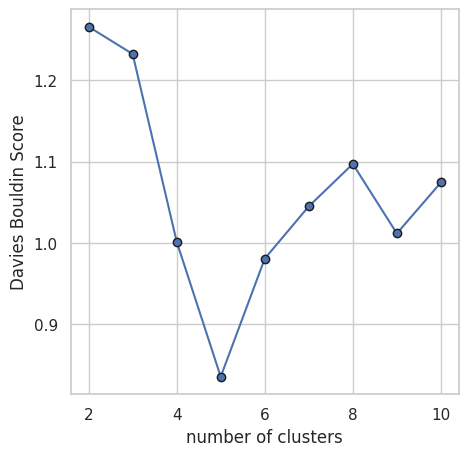

In [ ]:
from sklearn.cluster import KMeans
import sklearn

tsne_model = TSNE(n_components=3)
data_tsne = tsne_model.fit_transform(Scaled_data)
Sse = []
k3 = [2,3,4,5,6,7,8,9,10]
temp1 = []
for i in range(2,11):
  kmean_1 = KMeans(n_clusters = i,random_state = 42)
  labels=kmean_1.fit_predict(data_pca)
  temp1.append(sklearn.metrics.davies_bouldin_score(data_pca, labels))
plt.plot(k3,temp1,marker = 'o',markeredgecolor='k')
plt.ylabel('Davies Bouldin Score')
plt.xlabel('number of clusters')
plt.rcParams["figure.figsize"] = (5,5)
plt.show()

In [ ]:
Silhouette_score1 = []
k = [2,3,4,5,6,7,8,9,10]
for i in range(2,11):
  kmean_4 = KMeans(n_clusters = i, random_state = 42)
  kmean_4.fit(data_tsne)
  Silhouette_score1.append(silhouette_score(data_tsne,labels=kmean_4.labels_))
print(Silhouette_score1)

[0.3918463, 0.2978974, 0.30574566, 0.2829121, 0.2950699, 0.30156732, 0.28176123, 0.28768295, 0.28453]


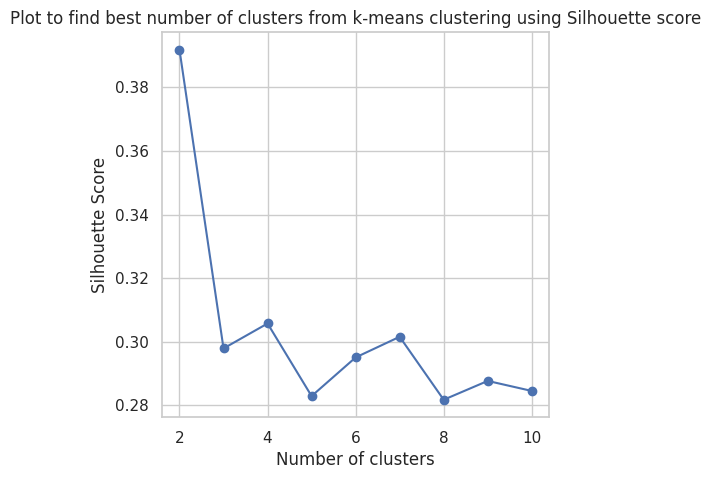

In [ ]:
plt.plot(k,Silhouette_score1,marker = 'o',markeredgecolor='b')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title("Plot to find best number of clusters from k-means clustering using Silhouette score")
plt.rcParams["figure.figsize"] = (5,5)
plt.show()

In [ ]:
# Judging by the elbow method,Silhouette score and Davies-Bouldin score , n_clusters=4
kmean_3 = KMeans(n_clusters = 4, random_state = 42)
kmean_3.fit(data_tsne)

KMeans(n_clusters=4, random_state=42)

In [ ]:
Country_data1 = pd.read_csv("/content/Country-data.csv")
Country_data1['label1'] = kmean_3.fit_predict(data_tsne)
Country_data1.head(20)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label1
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.440,56.2,5.82,553,1
1,Albania,16.6,28.0,6.55,48.6,9930,4.490,76.3,1.65,4090,3
2,Algeria,27.3,38.4,4.17,31.4,12900,16.100,76.5,2.89,4460,0
3,Angola,119.0,62.3,2.85,42.9,5900,22.400,60.1,6.16,3530,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.440,76.8,2.13,12200,3
5,Argentina,14.5,18.9,8.10,16.0,18700,20.900,75.8,2.37,10300,0
6,Armenia,18.1,20.8,4.40,45.3,6700,7.770,73.3,1.69,3220,0
7,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900,2
8,Austria,4.3,51.3,11.00,47.8,43200,0.873,80.5,1.44,46900,2
9,Azerbaijan,39.2,54.3,5.88,20.7,16000,13.800,69.1,1.92,5840,0


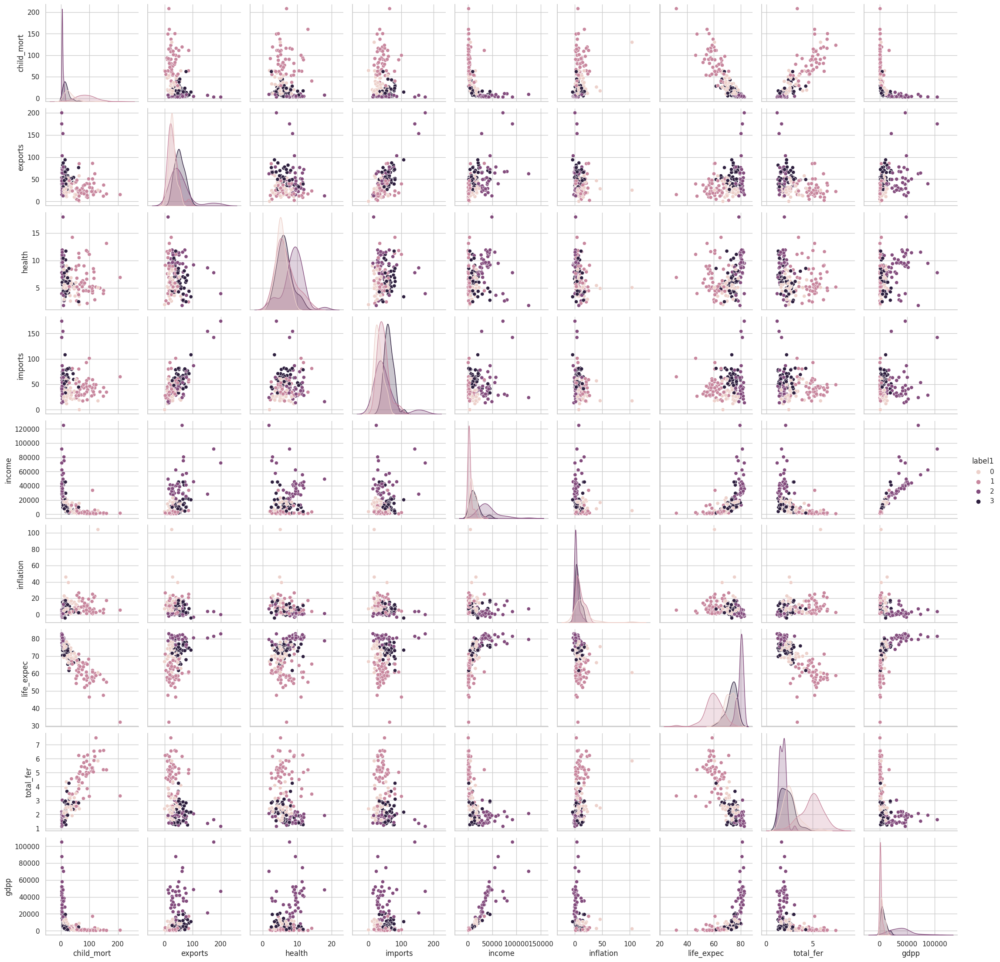

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(Country_data1, hue='label1');

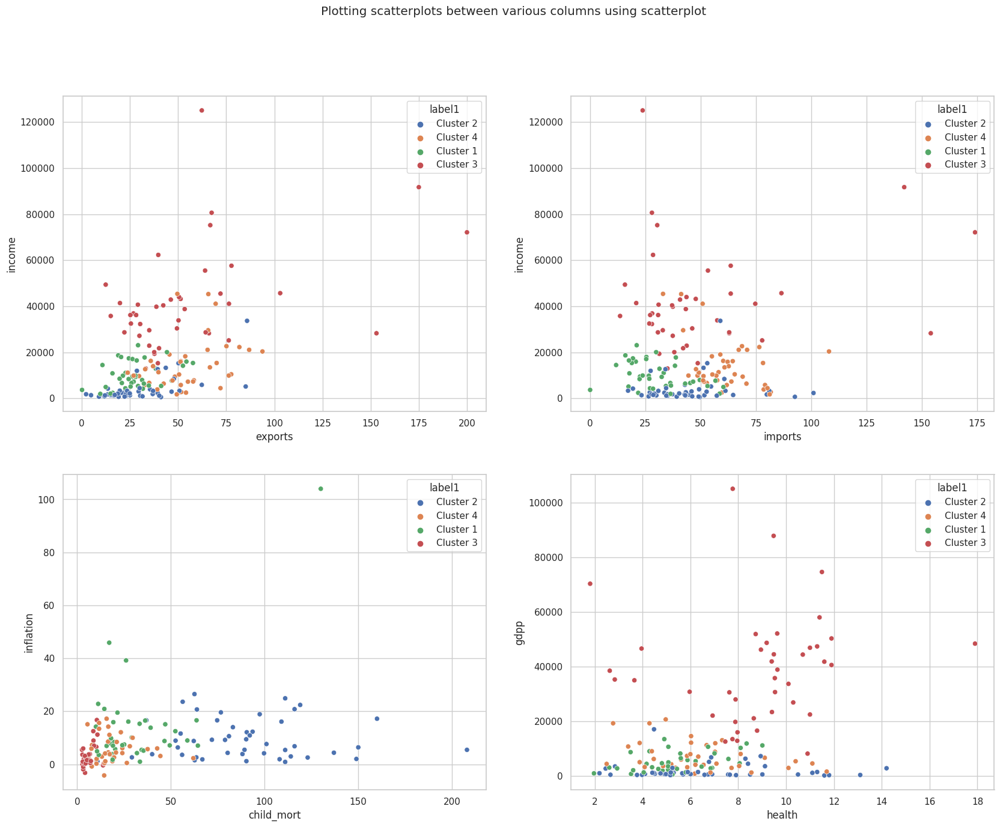

In [ ]:
fig,axs=plt.subplots(nrows=2,ncols=2,figsize=(20,15))
sns.scatterplot(data=Country_data1, x='exports', y='income', hue='label1', ax=axs[0][0])
sns.scatterplot(data=Country_data1, x='imports', y='income', hue='label1', ax=axs[0][1])
sns.scatterplot(data=Country_data1, x='child_mort', y='inflation', hue='label1', ax=axs[1][0])
sns.scatterplot(data=Country_data1, x='health', y='gdpp', hue='label1', ax=axs[1][1])
fig.suptitle("Plotting scatterplots between various columns using scatterplot")
plt.show()

In [ ]:
category1 = "Cluster 1"
category2 = "Cluster 2"
category3 = "Cluster 3"
category4 = "Cluster 4"
category = {0:category1,1:category2,2:category3,3:category4}
Country_data1['label1'] = Country_data1['label1'].map(category)
Country_data1.head(20)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label1
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.440,56.2,5.82,553,Cluster 2
1,Albania,16.6,28.0,6.55,48.6,9930,4.490,76.3,1.65,4090,Cluster 4
2,Algeria,27.3,38.4,4.17,31.4,12900,16.100,76.5,2.89,4460,Cluster 1
3,Angola,119.0,62.3,2.85,42.9,5900,22.400,60.1,6.16,3530,Cluster 2
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.440,76.8,2.13,12200,Cluster 4
5,Argentina,14.5,18.9,8.10,16.0,18700,20.900,75.8,2.37,10300,Cluster 1
6,Armenia,18.1,20.8,4.40,45.3,6700,7.770,73.3,1.69,3220,Cluster 1
7,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900,Cluster 3
8,Austria,4.3,51.3,11.00,47.8,43200,0.873,80.5,1.44,46900,Cluster 3
9,Azerbaijan,39.2,54.3,5.88,20.7,16000,13.800,69.1,1.92,5840,Cluster 1


In [ ]:
px.choropleth(data_frame=Country_data1, locationmode='country names', locations='country', color=Country_data1['label1'], title='Countries clusters with need for aid rising in the order: Cluster 3,Cluster 4,Cluster 1,Cluster 2',
              color_discrete_map={'Cluster 1':'#FFEC06','Cluster 1':'#06FF0A','Cluster 4':'#C73313','Cluster 3':'#3454EE'} ,projection='equirectangular')

# Fuzzy K-means clustering

## Fuzzy K-means clustering (PCA)

In [ ]:
fd_pca = FDataGrid(data_pca)
fcm = FuzzyCMeans(n_clusters=4)
labels=fcm.fit_predict(fd_pca)

In [ ]:
Country_copy=pd.read_csv("/content/Country-data.csv")
Country_copy['label'] = labels

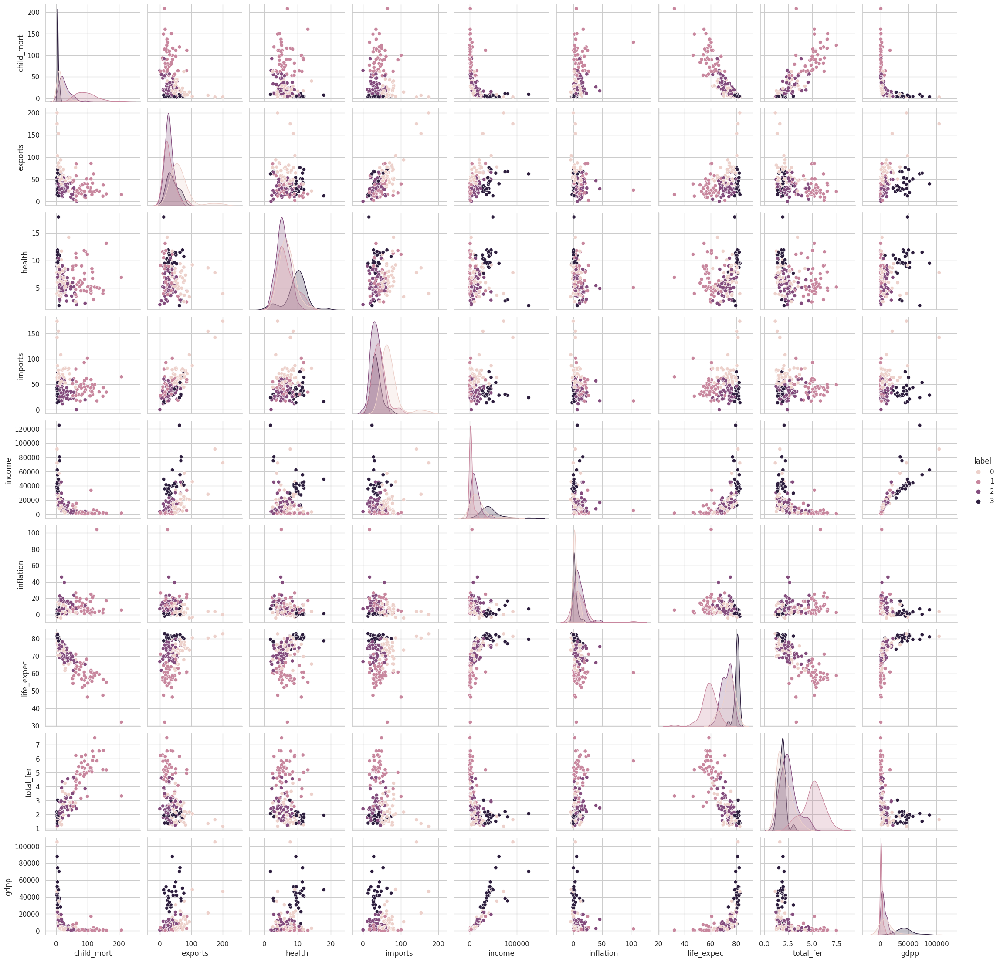

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(Country_copy, hue='label');

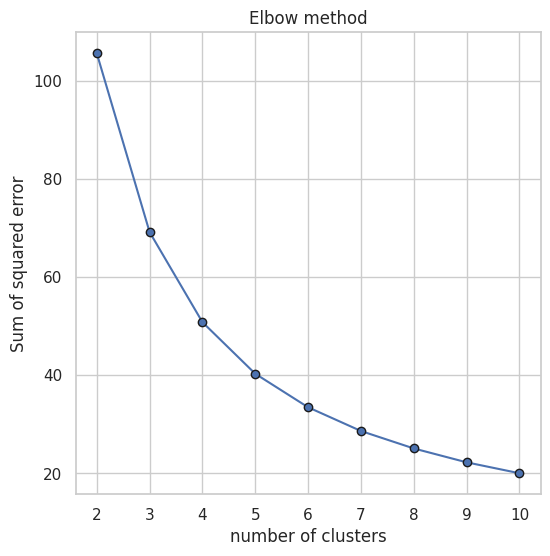

In [ ]:
pca_model2 = PCA(n_components = 6)
data_pca = pca_model2.fit_transform(Scaled_data)
temp = []
k = [2,3,4,5,6,7,8,9,10]
for i in range(2,11):
  fuzzykm = FuzzyCMeans(n_clusters = i)
  pca_scale = FDataGrid(data_pca)
  fuzzykm.fit(pca_scale)
  temp.append(fuzzykm.inertia_)
plt.figure(figsize = (6,6))
plt.plot(k,temp,marker = 'o',markeredgecolor='k')
plt.title('Elbow method')
plt.xlabel('number of clusters')
plt.ylabel('Sum of squared error')
plt.show()

In [ ]:
Silhouette_score1 = []
for i in range(2,11):
  fuzzykm2 = FuzzyCMeans(n_clusters = i)
  pca_scale = FDataGrid(data_pca)
  fuzzykm2.fit(pca_scale)
  Silhouette_score1.append(silhouette_score(data_pca,labels=fuzzykm2.labels_))
k2 = [2,3,4,5,6,7,8,9,10]
print(Silhouette_score1)

[0.2888620926750976, 0.2575031726273197, 0.22446091951697378, 0.15940725968114164, 0.11434492284158601, 0.04582996085093533, 0.1012094673458281, 0.10761854630359036, 0.04696806294831033]


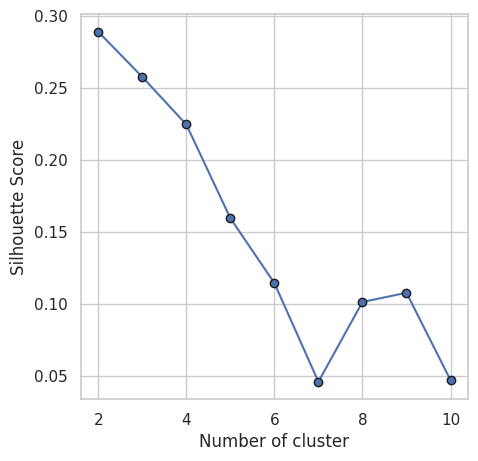

In [ ]:
plt.plot(k2,Silhouette_score1,marker = 'o',markeredgecolor='k')
plt.xlabel('Number of cluster')
plt.ylabel('Silhouette Score')
plt.show()

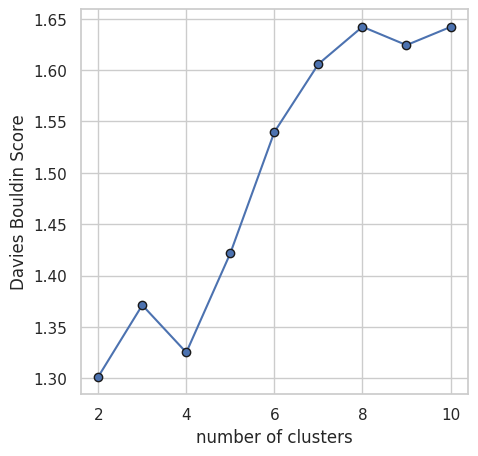

In [ ]:
import sklearn
temp2 = []
for i in range(2,11):
  fuzzykm = FuzzyCMeans(n_clusters = i)
  pca_scale = FDataGrid(data_pca)
  labels=fuzzykm.fit_predict(pca_scale)
  temp2.append(sklearn.metrics.davies_bouldin_score(data_pca, labels))
plt.plot(k2,temp2,marker = 'o',markeredgecolor='k')
plt.ylabel('Davies Bouldin Score')
plt.xlabel('number of clusters')
plt.rcParams["figure.figsize"] = (5,5)
plt.show()

In [ ]:
category1 = "Cluster 1"
category2 = "Cluster 2"
category3 = "Cluster 3"
category4 = "Cluster 4"
category = {0:category4,1:category3,2:category2,3:category1}
Country_copy['label'] = Country_copy['label'].map(category)
Country_copy.head(20)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.440,56.2,5.82,553,Cluster 3
1,Albania,16.6,28.0,6.55,48.6,9930,4.490,76.3,1.65,4090,Cluster 2
2,Algeria,27.3,38.4,4.17,31.4,12900,16.100,76.5,2.89,4460,Cluster 2
3,Angola,119.0,62.3,2.85,42.9,5900,22.400,60.1,6.16,3530,Cluster 3
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.440,76.8,2.13,12200,Cluster 4
5,Argentina,14.5,18.9,8.10,16.0,18700,20.900,75.8,2.37,10300,Cluster 2
6,Armenia,18.1,20.8,4.40,45.3,6700,7.770,73.3,1.69,3220,Cluster 2
7,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900,Cluster 1
8,Austria,4.3,51.3,11.00,47.8,43200,0.873,80.5,1.44,46900,Cluster 1
9,Azerbaijan,39.2,54.3,5.88,20.7,16000,13.800,69.1,1.92,5840,Cluster 2


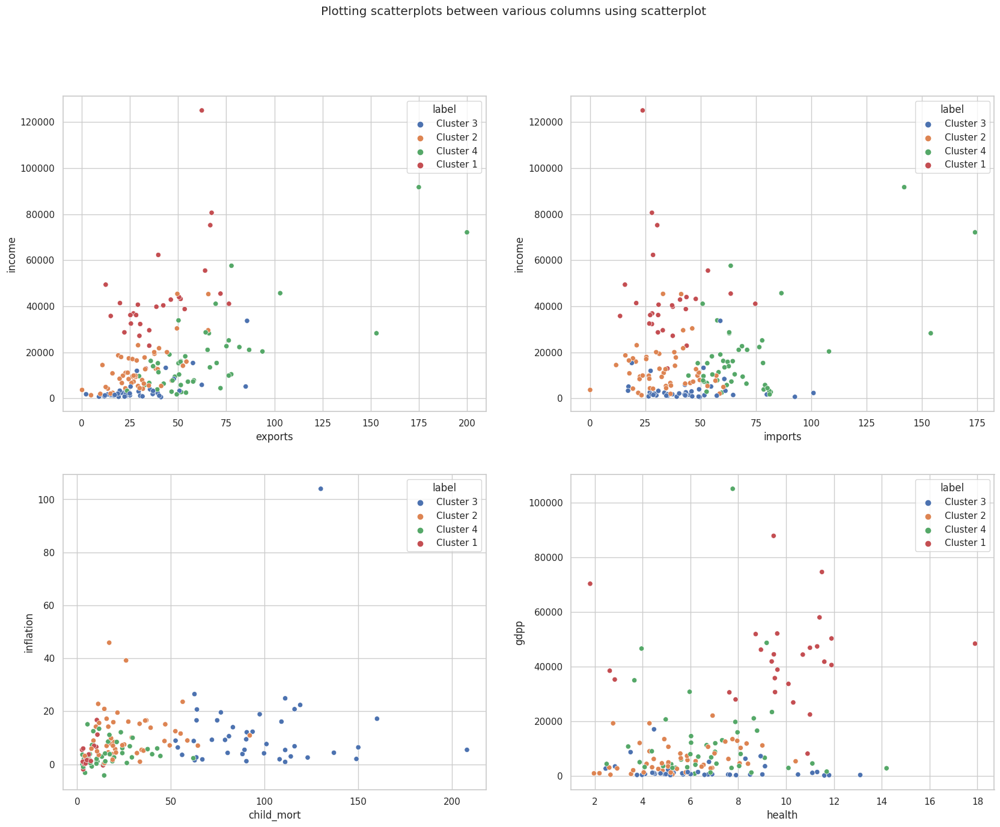

In [ ]:
fig,axs=plt.subplots(nrows=2,ncols=2,figsize=(20,15))
sns.scatterplot(data=Country_copy, x='exports', y='income', hue='label',cmap='viridis', ax=axs[0][0])
sns.scatterplot(data=Country_copy, x='imports', y='income', hue='label',cmap='viridis', ax=axs[0][1])
sns.scatterplot(data=Country_copy, x='child_mort', y='inflation', hue='label',cmap='viridis', ax=axs[1][0])
sns.scatterplot(data=Country_copy, x='health', y='gdpp', hue='label',cmap='viridis', ax=axs[1][1])
fig.suptitle("Plotting scatterplots between various columns using scatterplot")
plt.show()

In [ ]:
px.choropleth(data_frame=Country_copy, locationmode='country names', locations='country', color=Country_copy['label'], title='Countries clusters with the need for aid rising in the order : Cluster 1,Cluster 4,Cluster 2,Cluster 3 ',
              color_discrete_map={'Cluster 1':'#FFEC06','Cluster 2':'#06FF0A','Cluster 4':'#C73313','Cluster 3':'#3454EE'} ,projection='equirectangular')

## Fuzzy K-means clustering (t-SNE)

In [ ]:
fd_scale1 = FDataGrid(data_tsne)
fcm = FuzzyCMeans(n_clusters=4)
labels1=fcm.fit_predict(fd_scale1)

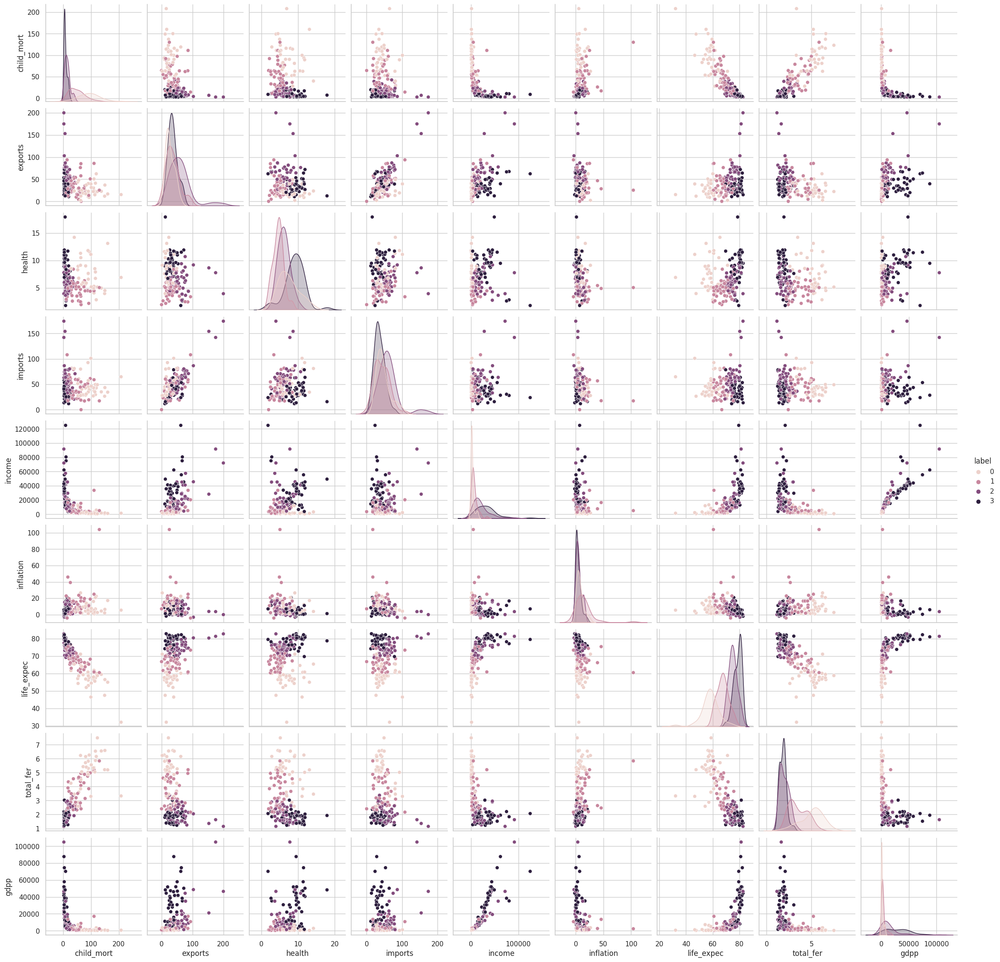

In [ ]:
Country_copy=pd.read_csv("/content/Country-data.csv")
Country_copy['label'] = labels1
sns.set(style="whitegrid")
sns.pairplot(Country_copy, hue='label');

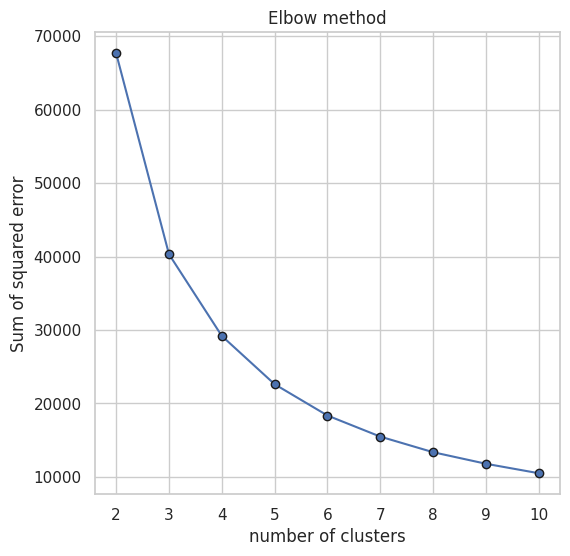

In [ ]:
pca_model3 = PCA(n_components = 6)
temp4 = []
k = [2,3,4,5,6,7,8,9,10]
for i in range(2,11):
  fuzzykm = FuzzyCMeans(n_clusters = i)
  tsne_scale = FDataGrid(data_tsne)
  fuzzykm.fit(tsne_scale)
  temp4.append(fuzzykm.inertia_)
plt.figure(figsize = (6,6))
plt.plot(k,temp4,marker = 'o',markeredgecolor='k')
plt.title('Elbow method')
plt.xlabel('number of clusters')
plt.ylabel('Sum of squared error')
plt.show()

In [ ]:
Silhouette_score2 = []
for i in range(2,11):
  fuzzykm3 = FuzzyCMeans(n_clusters = i)
  tsne_scale = FDataGrid(data_tsne)
  fuzzykm3.fit(tsne_scale)
  Silhouette_score2.append(silhouette_score(data_tsne,labels=fuzzykm3.labels_))
k3 = [2,3,4,5,6,7,8,9,10]
print(Silhouette_score2)

[0.35467234, 0.25187182, 0.2097597, 0.20725605, 0.18730855, 0.2063953, 0.18391821, 0.18753016, 0.1772293]


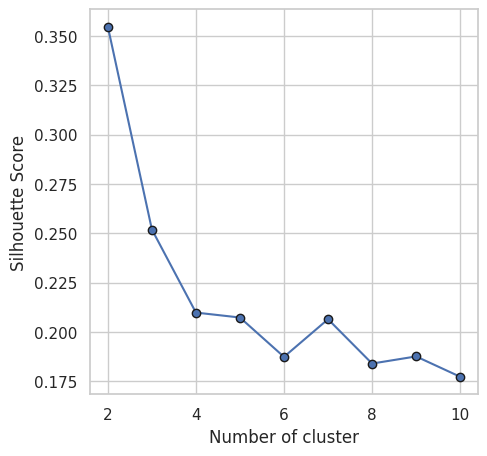

In [ ]:
plt.plot(k3,Silhouette_score2,marker = 'o',markeredgecolor='k')
plt.xlabel('Number of cluster')
plt.ylabel('Silhouette Score')
plt.show()

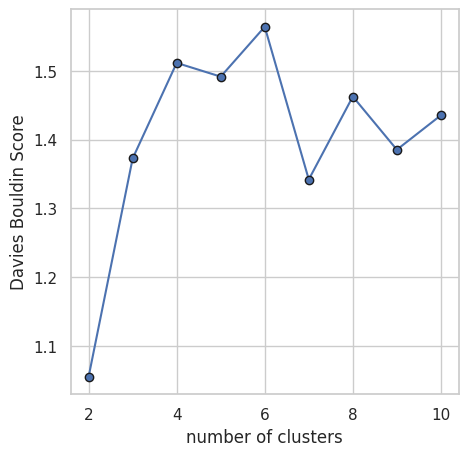

In [ ]:
import sklearn
temp3 = []
for i in range(2,11):
  fuzzykm = FuzzyCMeans(n_clusters = i)
  tsne_scale = FDataGrid(data_tsne)
  labels=fuzzykm.fit_predict(tsne_scale)
  temp3.append(sklearn.metrics.davies_bouldin_score(data_tsne, labels))
plt.plot(k3,temp3,marker = 'o',markeredgecolor='k')
plt.ylabel('Davies Bouldin Score')
plt.xlabel('number of clusters')
plt.rcParams["figure.figsize"] = (5,5)
plt.show()

In [ ]:
category1 = "Cluster 1"
category2 = "Cluster 2"
category3 = "Cluster 3"
category4 = "Cluster 4"
category = {0:category1,1:category2,2:category3,3:category4}
Country_copy['label'] = Country_copy['label'].map(category)
Country_copy.head(20)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,label
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.440,56.2,5.82,553,Cluster 1
1,Albania,16.6,28.0,6.55,48.6,9930,4.490,76.3,1.65,4090,Cluster 3
2,Algeria,27.3,38.4,4.17,31.4,12900,16.100,76.5,2.89,4460,Cluster 2
3,Angola,119.0,62.3,2.85,42.9,5900,22.400,60.1,6.16,3530,Cluster 1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.440,76.8,2.13,12200,Cluster 3
5,Argentina,14.5,18.9,8.10,16.0,18700,20.900,75.8,2.37,10300,Cluster 4
6,Armenia,18.1,20.8,4.40,45.3,6700,7.770,73.3,1.69,3220,Cluster 3
7,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900,Cluster 4
8,Austria,4.3,51.3,11.00,47.8,43200,0.873,80.5,1.44,46900,Cluster 4
9,Azerbaijan,39.2,54.3,5.88,20.7,16000,13.800,69.1,1.92,5840,Cluster 3


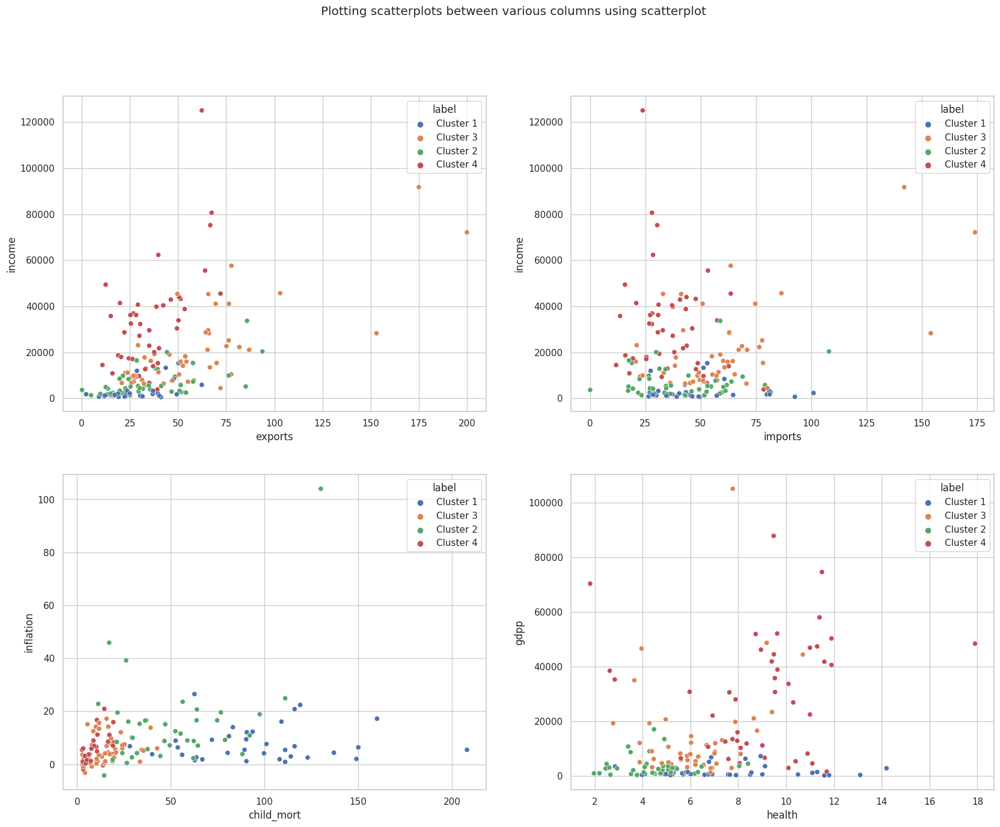

In [ ]:
fig,axs=plt.subplots(nrows=2,ncols=2,figsize=(20,15))
sns.scatterplot(data=Country_copy, x='exports', y='income', hue='label',cmap='viridis', ax=axs[0][0])
sns.scatterplot(data=Country_copy, x='imports', y='income', hue='label',cmap='viridis', ax=axs[0][1])
sns.scatterplot(data=Country_copy, x='child_mort', y='inflation', hue='label',cmap='viridis', ax=axs[1][0])
sns.scatterplot(data=Country_copy, x='health', y='gdpp', hue='label',cmap='viridis', ax=axs[1][1])
fig.suptitle("Plotting scatterplots between various columns using scatterplot")
plt.show()

In [ ]:
px.choropleth(data_frame=Country_copy, locationmode='country names', locations='country', color=Country_copy['label'], title='Countries clusters with the need for aid rising int the order: Cluster 4,Cluster 3,Cluster 2,Cluster 1',
              color_discrete_map={'Cluster 1':'#FFEC06','Cluster 1':'#06FF0A','Cluster 4':'#C73313','Cluster 3':'#3454EE'} ,projection='equirectangular')